# Portfolio Optimization


In [1]:
# importing packages
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import numpy as np
import pandas as pd
import yfinance as yf
import scipy.stats as scs
import statsmodels.api as sm
from statsmodels.regression.rolling import RollingOLS
from itertools import product

In [2]:
# universal plot dimensions we will use as the figsize argument for all plots
aspect_ratio=(10,7)
pct_format_4d = '{:.4%}'
pct_format_2d = '{:.2%}'
annualization_factor=260

In [3]:
# function to view and describe dataframe
def read_data_frame(filename, index_col=0, parse_dates=True):
    dF = pd.read_csv(filename, index_col=index_col, parse_dates=parse_dates).dropna()
    print('\n1)','INFO:')
    dF.info() # print info
    print('\n2)', 'ANY NULL VALUES?')
    print(dF.isnull().sum()) # check if any null values
    print('\n3)', 'SUMMARY STATISTICS:')
    display(dF.describe()) # print summary statistics
    print('\n4)', 'DATA:')
    display(dF)
    return dF

# function to pretty print a dataframe
def print_data_frame_pct (dF, pct_format=pct_format_2d, nan='NaN', indexSlice=pd.IndexSlice[:,:]):
    display(dF.style.format(pct_format, na_rep=nan, subset=indexSlice))
    
# calculate and print the summary statistics table
def calc_summary_stats(dataFrame, af=annualization_factor, pct_format=pct_format_2d):
    dF = dataFrame.copy()
    dF.dropna(inplace=True)
    cumRtns = dF.cumsum() # adding up log returns
    summary_stats = pd.DataFrame([af*dF.mean(),
                                  np.sqrt(af)*dF.std(),
                                  np.sqrt(af) * dF.mean() / dF.std(), 
                                  (cumRtns - np.maximum.accumulate(cumRtns)).min(axis=0),
                                  (dF >= 0).sum() / dF.shape[0]
                                 ],
                                 index=['Average Annual Return', 'Annual Risk', 'Sharpe Ratio', 'maxDD', 'Success Ratio']
                                )
    print_data_frame_pct(summary_stats, pct_format=pct_format, indexSlice=pd.IndexSlice[['Average Annual Return', 'Annual Risk', 'maxDD', 'Success Ratio'], :])
    return summary_stats

In [13]:
# read the data
prices = read_data_frame('Prices.csv')

# list for all instrument tickers
all_instruments = ['AAPL', 'AMZN', 'ATT', 'GE', 'INTC', 'SPY', 'BOND', 'AUD', 'EUR', 'GOLD', 'SILVER']
# list for selected instrument tickers
selected_instruments = ['AAPL', 'AMZN', 'GE', 'INTC', 'SPY', 'BOND', 'EUR', 'GOLD']


1) INFO:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4745 entries, 1999-12-31 to 2018-12-31
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    4745 non-null   float64
 1   AMZN    4745 non-null   float64
 2   ATT     4745 non-null   float64
 3   AUD     4745 non-null   float64
 4   BOND    4745 non-null   float64
 5   EUR     4745 non-null   float64
 6   GE      4745 non-null   float64
 7   GOLD    4745 non-null   float64
 8   INTC    4745 non-null   float64
 9   SILVER  4745 non-null   float64
 10  SPY     4745 non-null   float64
dtypes: float64(11)
memory usage: 444.8 KB

2) ANY NULL VALUES?
AAPL      0
AMZN      0
ATT       0
AUD       0
BOND      0
EUR       0
GE        0
GOLD      0
INTC      0
SILVER    0
SPY       0
dtype: int64

3) SUMMARY STATISTICS:


,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
count,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000
mean,12.906481,14.276243,24.837516,0.784642,1002.848125,1.214517,217.450605,910.952462,28.220152,14.879354,150.594514
std,13.980654,20.515985,5.171241,0.151062,76.259687,0.169549,78.177993,463.432487,10.666220,8.763344,50.893894
min,0.234286,0.298500,14.607251,0.479000,790.241628,0.827200,51.230770,255.550000,12.080000,4.060000,68.110001
25%,1.089286,1.973500,20.037764,0.707200,957.942747,1.112800,155.384613,418.350000,21.080000,6.805000,114.570000
50%,6.513214,4.441000,25.188822,0.766700,1003.602410,1.235500,215.692307,954.950000,25.230000,14.666000,133.779999
75%,22.629999,16.110001,28.429003,0.903000,1065.474821,1.336800,264.461548,1277.980000,32.799999,18.310500,186.309998
max,58.017502,101.975502,44.184292,1.102000,1128.970002,1.599100,461.538452,1897.460000,74.875000,48.443800,293.579987



4) DATA:


,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
1999-12-31,0.917969,3.806250,36.820244,0.6567,798.154631,1.0062,396.794861,288.00,41.156250,5.3800,146.875000
2000-01-03,0.999442,4.468750,35.498489,0.6585,793.868670,1.0243,384.615387,289.00,43.500000,5.4050,145.437500
2000-01-04,0.915179,4.096875,33.421452,0.6550,796.761677,1.0296,369.230774,282.25,41.468750,5.3250,139.750000
2000-01-05,0.928571,3.487500,33.940708,0.6579,793.118215,1.0321,368.589752,280.00,41.812500,5.1450,140.000000
2000-01-06,0.848214,3.278125,33.043808,0.6533,795.091984,1.0328,373.517639,281.10,39.375000,5.1200,137.750000
...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,36.707500,67.197998,20.664654,0.7049,998.805410,1.1406,53.230770,1269.22,43.590000,14.7750,234.339996
2018-12-26,39.292500,73.544998,21.208460,0.7066,996.301026,1.1353,56.846153,1267.14,46.189999,15.0355,246.179993
2018-12-27,39.037498,73.082001,21.261330,0.7033,998.396182,1.1430,55.923077,1275.71,46.360001,15.2275,248.070007
2018-12-28,39.057499,73.901001,21.495468,0.7047,998.680796,1.1444,57.769230,1280.71,46.750000,15.3839,247.750000


## Calculate returns and Sharpe ratios

### Benchmark Strategy

In [14]:
# compute simple returns
simpleReturns = prices.pct_change()
print_data_frame_pct(simpleReturns)

,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
1999-12-31 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-03 00:00:00,8.88%,17.41%,-3.59%,0.27%,-0.54%,1.80%,-3.07%,0.35%,5.69%,0.46%,-0.98%
2000-01-04 00:00:00,-8.43%,-8.32%,-5.85%,-0.53%,0.36%,0.52%,-4.00%,-2.34%,-4.67%,-1.48%,-3.91%
2000-01-05 00:00:00,1.46%,-14.87%,1.55%,0.44%,-0.46%,0.24%,-0.17%,-0.80%,0.83%,-3.38%,0.18%
2000-01-06 00:00:00,-8.65%,-6.00%,-2.64%,-0.70%,0.25%,0.07%,1.34%,0.39%,-5.83%,-0.49%,-1.61%
2000-01-07 00:00:00,4.74%,6.10%,0.86%,0.24%,0.26%,-0.32%,3.87%,0.23%,4.13%,1.07%,5.81%
2000-01-10 00:00:00,-1.76%,-0.54%,1.42%,0.18%,-0.17%,-0.38%,-0.04%,-0.10%,4.57%,-0.58%,0.34%
2000-01-11 00:00:00,-5.12%,-3.52%,-1.40%,0.26%,-0.48%,0.78%,0.17%,0.63%,4.59%,0.29%,-1.20%
2000-01-12 00:00:00,-6.00%,-4.78%,-5.24%,0.14%,-0.14%,-0.26%,0.33%,-0.32%,1.74%,-1.07%,-0.99%
2000-01-13 00:00:00,10.97%,3.74%,-2.39%,1.40%,0.44%,-0.49%,1.15%,0.67%,-0.21%,0.10%,1.35%


In [15]:
# compute log returns
log_returns = np.log(prices/prices.shift(1))
print_data_frame_pct(log_returns)

,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
1999-12-31 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-03 00:00:00,8.50%,16.05%,-3.66%,0.27%,-0.54%,1.78%,-3.12%,0.35%,5.54%,0.46%,-0.98%
2000-01-04 00:00:00,-8.81%,-8.69%,-6.03%,-0.53%,0.36%,0.52%,-4.08%,-2.36%,-4.78%,-1.49%,-3.99%
2000-01-05 00:00:00,1.45%,-16.10%,1.54%,0.44%,-0.46%,0.24%,-0.17%,-0.80%,0.83%,-3.44%,0.18%
2000-01-06 00:00:00,-9.05%,-6.19%,-2.68%,-0.70%,0.25%,0.07%,1.33%,0.39%,-6.01%,-0.49%,-1.62%
2000-01-07 00:00:00,4.63%,5.92%,0.85%,0.24%,0.26%,-0.32%,3.80%,0.23%,4.04%,1.07%,5.65%
2000-01-10 00:00:00,-1.77%,-0.54%,1.41%,0.18%,-0.17%,-0.38%,-0.04%,-0.10%,4.47%,-0.58%,0.34%
2000-01-11 00:00:00,-5.25%,-3.59%,-1.41%,0.26%,-0.48%,0.78%,0.17%,0.63%,4.49%,0.29%,-1.20%
2000-01-12 00:00:00,-6.18%,-4.89%,-5.38%,0.14%,-0.14%,-0.26%,0.33%,-0.32%,1.73%,-1.07%,-1.00%
2000-01-13 00:00:00,10.41%,3.67%,-2.42%,1.39%,0.44%,-0.50%,1.14%,0.67%,-0.21%,0.10%,1.35%


In [16]:
# printing out the summary statistics
summary_stats = calc_summary_stats(log_returns)

,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
Average Annual Return,20.61%,16.34%,-2.93%,0.39%,1.24%,0.72%,-10.52%,8.19%,0.72%,5.80%,2.91%
Annual Risk,43.31%,53.66%,26.62%,13.15%,3.75%,10.21%,31.43%,17.82%,38.00%,30.46%,19.62%
Sharpe Ratio,0.475834,0.304578,-0.110222,0.029530,0.331122,0.070168,-0.334616,0.459479,0.018933,0.190360,0.148482
maxDD,-170.38%,-270.61%,-110.69%,-48.78%,-14.21%,-43.14%,-219.82%,-59.07%,-182.43%,-126.48%,-83.18%
Success Ratio,52.23%,51.22%,51.64%,52.72%,52.47%,50.99%,50.08%,52.45%,51.69%,54.09%,53.94%


### Technical Analysis Strategies

In [18]:
# Moving Average Crossover function that gives out a value of Sharpe.
def movingAverageCrossover(dataFrame, flatorShort, fastWindow=33, slowWindow=220):
    dfPrices = dataFrame.copy()
    # rename column   
    dfPrices.columns = ['Close']  
    
    # calculate the fast MA and slow MA
    dfPrices.loc[:,'FastSMA'] = dfPrices['Close'].rolling(fastWindow).mean()
    dfPrices.loc[:,'SlowSMA'] = dfPrices['Close'].rolling(slowWindow).mean()
    dfPrices.dropna(inplace=True)
    
    # SMA strategy: if rising trend, stay long, otherwise go flatorShort
    dfPrices.loc[:,'Position'] = np.where(dfPrices['FastSMA'] > dfPrices['SlowSMA'], 1, np.where(dfPrices['FastSMA'] < dfPrices['SlowSMA'], flatorShort, 0))   
    # calculate stock price log returns
    dfPrices.loc[:,'OriginalReturns'] = np.log(dfPrices['Close'] / dfPrices['Close'].shift(1))
    # calculte the strategy returns
    dfPrices.loc[:,'SMAReturns'] = dfPrices['Position'].shift(1) * dfPrices['OriginalReturns']
    dfPrices.dropna(inplace=True)
    sharpe_ratio = np.sqrt(annualization_factor) * dfPrices['SMAReturns'].mean() / dfPrices['SMAReturns'].std()
    return dfPrices['SMAReturns']

In [19]:
# Bollinger Bands function that gives out a value of Sharpe.
def bollingerBands(df, window=20, stDevBand=2):
    dfPrices = df.copy()
    # rename column   
    dfPrices.columns = ['Close']
    # calculate the rolling mean, std
    dfPrices.loc[:,'Mean'] = dfPrices['Close'].rolling(window).mean()
    dfPrices.loc[:,'Stdev'] = dfPrices['Close'].rolling(window).std()
    # create the upper Bollinger band and the lower one
    dfPrices.loc[:,'Upper'] = dfPrices['Mean'] + stDevBand * dfPrices['Stdev']
    dfPrices.loc[:,'Lower'] = dfPrices['Mean'] - stDevBand * dfPrices['Stdev']
    dfPrices.dropna(inplace=True)

    # implement the Bollinger band based strategy
    # initialize the first row based on the close price vis-a-vis the bands
    # initialize a new column called 'Position'
    date0 = dfPrices.index[0]
    if dfPrices.loc[date0,'Close'] >= dfPrices.loc[date0, 'Upper']:
        dfPrices.loc[date0, 'Position'] = -1
    elif dfPrices.loc[date0,'Close'] <= dfPrices.loc[date0,'Lower']:
        dfPrices.loc[date0, 'Position'] = 1
    else:
        dfPrices.loc[date0, 'Position'] = 0
        
    # loop over the entire data set
    for i in range(1, dfPrices.shape[0]):
        today=dfPrices.index[i]
        yesterday=dfPrices.index[i-1]
        if dfPrices.loc[today,'Close'] >= dfPrices.loc[today,'Upper']: # if close is above upper
            dfPrices.loc[today,'Position'] = -1 # then go short
        elif dfPrices.loc[today,'Close'] <= dfPrices.loc[today,'Lower']: # if close is below lower
            dfPrices.loc[today,'Position'] = 1 # then go long
        elif dfPrices.loc[yesterday,'Position'] == -1 and dfPrices.loc[today,'Close'] <= dfPrices.loc[today,'Mean']: # if prev day is short and we're now below the mean
            dfPrices.loc[today,'Position']=0 # then flatten
        elif dfPrices.loc[yesterday,'Position'] == 1 and dfPrices.loc[today, 'Close'] >= dfPrices.loc[today, 'Mean']: # conversely...
            dfPrices.loc[today,'Position']=0 # then also flatten
        else: # otherwise just hold yesterday's position
            dfPrices.loc[today,'Position']=dfPrices.loc[yesterday,'Position']        
    
    # calculate the returns of the Close price
    dfPrices.loc[:,'OriginalReturns'] = np.log(dfPrices['Close'] / dfPrices['Close'].shift(1))    
    # calculate the rturns of the Bollinger strategy
    dfPrices.loc[:,'BBReturns'] = dfPrices['Position'].shift(1) * dfPrices['OriginalReturns']
    dfPrices.dropna(inplace=True)
    sharpe_ratio = np.sqrt(annualization_factor)*dfPrices['BBReturns'].mean() / dfPrices['BBReturns'].std()
    return dfPrices['BBReturns']

### Sharpe Ratios across All Strategies

In [20]:
# Moving Average Crossover goes flat
MACFlatSharpeRatio = []
for i in range(prices.shape[1]):
  SMAReturns = movingAverageCrossover(prices.iloc[:,i].to_frame(),flatorShort=0)
  sharpe_ratio = np.sqrt(annualization_factor) * SMAReturns.mean() / SMAReturns.std()
  MACFlatSharpeRatio.append(sharpe_ratio)

In [22]:
# Moving Average Crossover goes short
MACShortSharpeRatio = []
for i in range(prices.shape[1]):
  SMAReturns = movingAverageCrossover(prices.iloc[:,i].to_frame(),flatorShort=-1)
  sharpe_ratio = np.sqrt(annualization_factor) * SMAReturns.mean() / SMAReturns.std()
  MACShortSharpeRatio.append(sharpe_ratio)

In [23]:
# Bollinger Bands
BBSharpeRatio = []
for i in range(prices.shape[1]):
  BBReturns = bollingerBands(prices.iloc[:,i].to_frame())
  sharpe_ratio = np.sqrt(annualization_factor)*BBReturns.mean() / BBReturns.std()
  BBSharpeRatio.append(sharpe_ratio)

In [24]:
# printing out Sharpe of applying each strategy
dfSharpe = pd.DataFrame(columns=prices.columns, index=['Benchmark','MAC_Flat','MAC_Short','BB'])
dfSharpe.loc['Benchmark'] = summary_stats.loc['Sharpe Ratio'].values
dfSharpe.loc['MAC_Flat'] = MACFlatSharpeRatio
dfSharpe.loc['MAC_Short'] = MACShortSharpeRatio
dfSharpe.loc['BB'] = BBSharpeRatio
print('Instruments Shapre by Strategies:')
display(dfSharpe)

Instruments Shapre by Strategies:


,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
Benchmark,0.475834,0.304578,-0.110222,0.02953,0.331122,0.070168,-0.334616,0.459479,0.018933,0.19036,0.148482
MAC_Flat,0.840946,0.596136,-0.068779,0.176634,0.235934,0.172608,0.139649,0.572177,0.016633,0.252892,0.624685
MAC_Short,0.533364,0.336003,0.087442,0.096061,0.100977,0.079154,0.481526,0.410734,-0.014139,0.166598,0.537313
BB,-0.434424,0.258309,0.213999,-0.03433,-0.184488,-0.248731,-0.249139,0.081292,0.313179,-0.138473,0.324608


### Calculate Correlations

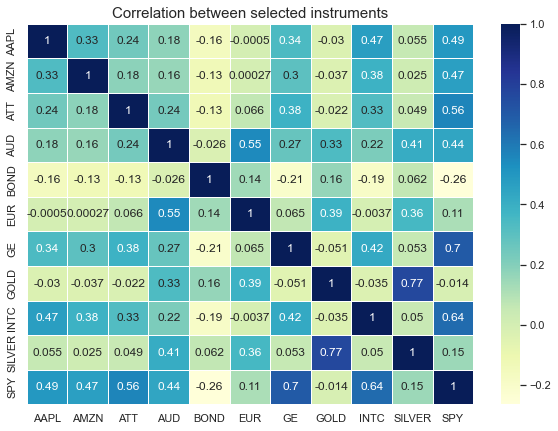

In [25]:
# correlation matrix of returns
corrmat = log_returns.dropna().corr()

#plotting a correlation matrix heatmap
fig = plt.figure()
sns.heatmap(corrmat,xticklabels=corrmat.columns, yticklabels=corrmat.columns, cmap='YlGnBu', annot=True, linewidth=0.5)
sns.set(rc={'figure.figsize':aspect_ratio})
plt.title('Correlation between selected instruments', fontsize=15)
plt.show(fig)

## Construct Portfolio

### Rationale for choices 
1. Looking for high sharpe ratios across all strategies for each instrument
*  Equity instruments: Drop ATT because it has the lowest Sharpe
  * AAPL Sharpe using MA crossover goes flat is 0.84
  * AMZN Sharpe using MA crossover goes flat is 0.59
  * ATT Sharpe using Bollinger Band strategy is 0.21
  * GE Sharpe using MA crossover goes short is 0.48
  * INTC Sharpe using Bollinger Band strategy is 0.31
  * SPY  Sharpe using MA crossover goes flat is 0.62
*  Fixed Income: 
  * Bond cumulative log returns having Sharpe of 0.33
*  Currency: Make the decision based on correlation because two Sharpe ratios are close
  * AUD Sharpe using MA crossover goes flat is 0.17
  * EUR cumulative log returns having Sharpe of 0.07
*  Commodity: Make the decision based on correlation because two Sharpe ratios are close
  * GOLD Sharpe using MA crossover goes flat is 0.57
  * SILVER Sharpe using MA crossover goes flat is 0.25
<br>
<br>
2. Looking for instruments having a low or negative correlation with equities to build a diversified portfolio minimizes the overall risk and helps the portfolio protect itself against wide swings in the whole market
*  Fixed Income: 
  * Bond shows negative correlation with most of the equities
*  Currency: Choose EUR
  * EUR correlation to other instruments is less than AUD correlation to other instruments
*  Commodity: Choose Gold
  * GOLD correlation to other instruments is less than SILVER correlation to other instruments and GOLD has higher Sharpe

In [41]:
# apply strategy on each instrument
portfolio_returns = pd.DataFrame(columns=selected_instruments)

portfolio_returns['AAPL'] = movingAverageCrossover(prices.loc[:,'AAPL'].to_frame(),flatorShort=0) # AAPL MACF
portfolio_returns['AMZN'] = movingAverageCrossover(prices.loc[:,'AMZN'].to_frame(),flatorShort=0) # AMZN MACF
portfolio_returns['GE'] = movingAverageCrossover(prices.loc[:,'GE'].to_frame(),flatorShort=-1) # GE MACS
portfolio_returns['INTC'] = bollingerBands(prices.loc[:,'INTC'].to_frame())['2000-11-14':] # INTC BB, line up the date with MA strategy
portfolio_returns['SPY'] = movingAverageCrossover(prices.loc[:,'SPY'].to_frame(),flatorShort=0) # SPY MACF
portfolio_returns['BOND'] = log_returns['2000-11-14':]['BOND'] # BOND Benchmark
portfolio_returns['EUR'] = log_returns['2000-11-14':]['EUR'] # EUR Benchmark
portfolio_returns['GOLD'] = movingAverageCrossover(prices.loc[:,'GOLD'].to_frame(),flatorShort=0) # GOLD MACF

### Mean Variance Optimization - 5000 Steps Monte Carlo Simulation

In [42]:
# initializing empty lists for returns and volumes
prets = []
pvols = []
pwts = []
pshrp = []

# random generator to generate a default range with a seed of 42
rng = np.random.default_rng(seed=100) 

n_assests = portfolio_returns.shape[1]
req_itrs = range(5000)

# generating a weight matrix for 8 securities over a loop
for i in req_itrs:
    wts = rng.random(n_assests)
    wts /= np.sum(wts)
    ret = annualization_factor * np.dot(wts, portfolio_returns.mean().T)
    vol = np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(wts, portfolio_returns.cov()), wts.T))
    sharpe = ret/vol
    prets.append(ret)
    pvols.append(vol)
    pwts.append(wts)
    pshrp.append(sharpe)

# creating an array for annualized returns and volumes for each loop iteration
prets = np.array(prets)
pvols = np.array(pvols)
pwts = np.array(pwts)
pshrp = np.array(pshrp)

### Return/Risk scatter plot of all the 5,000 portfolios

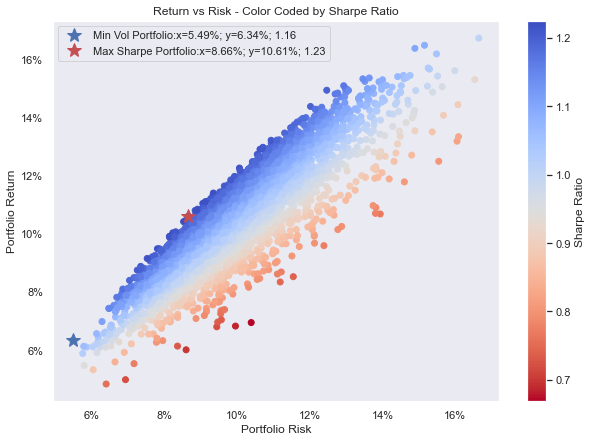

In [43]:
# supplementing the above chart with a colorbar based on the Sharpe ratio and demarkations for minimum vol portfolio and maximum Sharpe portfolio 

plt.figure(figsize=aspect_ratio)
ax = plt.subplot()
plt.scatter(pvols, prets, c = pshrp, marker='o', cmap='coolwarm_r')
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
plt.title('Return vs Risk - Color Coded by Sharpe Ratio')
plt.xlabel('Portfolio Risk')
plt.ylabel('Portfolio Return')
plt.rcParams['axes.grid'] = False
plt.colorbar(label='Sharpe Ratio')

# marking the minimum vol portfolio with a blue star
min_vol_prets = prets[np.argmin(pvols)]
min_vol_pvols = pvols[np.argmin(pvols)]
min_vol_sharpe = min_vol_prets/min_vol_pvols

plt.plot(min_vol_pvols, min_vol_prets, 'b*', markersize=15.0, label='Min Vol Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(min_vol_pvols, min_vol_prets, min_vol_sharpe)) 

# marking the maximum Sharpe portfolio with a red star
max_shrp_prets = prets[np.argmax(prets/pvols)]
max_shrp_pvols = pvols[np.argmax(prets/pvols)]
max_sharpe = np.max(prets/pvols)

plt.plot(max_shrp_pvols, max_shrp_prets, 'r*', markersize=15.0, label='Max Sharpe Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(max_shrp_pvols, max_shrp_prets, max_sharpe))

# constructing a legend for these two stars including risk, return and the Sharpe ratio
plt.legend()

## Portfolio Performance Evaluation

### Portfolio Optimization Weights for the Min Volatility and Max Sharpe Portfolios

In [44]:
wts_df = pd.DataFrame({'Weights Array': list(pwts), 'Sharpe Ratio': pshrp})
min_vol_wts = wts_df['Weights Array'].loc[wts_df['Sharpe Ratio'] == min_vol_sharpe].values[0]
max_sharpe_wts = wts_df['Weights Array'].loc[wts_df['Sharpe Ratio'] == max_sharpe].values[0]

allocation_df = pd.DataFrame({'Instrument' : selected_instruments, 'Min Vol Weights' : min_vol_wts, 'Max Sharpe Weights' : max_sharpe_wts}).set_index('Instrument')
allocation_df.loc['Total', :] = allocation_df.sum()
print_data_frame_pct(allocation_df)

,Min Vol Weights,Max Sharpe Weights
Instrument,,
AAPL,7.20%,19.46%
AMZN,5.22%,5.11%
GE,4.67%,8.32%
INTC,1.12%,6.11%
SPY,21.23%,14.01%
BOND,41.65%,18.95%
EUR,9.86%,3.44%
GOLD,9.06%,24.59%
Total,100.00%,100.00%


### Beta for the Max Sharpe Portfolio

In [48]:
# set up the beta calculation for portfolio
X = sm.add_constant(log_returns['2000-11-14':]['SPY'])
y = (portfolio_returns * max_sharpe_wts.tolist()).sum(axis = 1)
# fit the data in the OLS regression object
port_Reg = sm.OLS(y, X).fit()
print(port_Reg.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.084
Model:                            OLS   Adj. R-squared:                  0.084
Method:                 Least Squares   F-statistic:                     413.7
Date:                Fri, 16 Dec 2022   Prob (F-statistic):           4.55e-88
Time:                        21:40:22   Log-Likelihood:                 17431.
No. Observations:                4525   AIC:                        -3.486e+04
Df Residuals:                    4523   BIC:                        -3.484e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0004   7.64e-05      5.110      0.0

###  Equal-weighted portfolio and its Sharpe ratio

In [49]:
wts = np.repeat(1/n_assests,n_assests)
ret = annualization_factor * np.dot(wts, portfolio_returns.mean().T)
vol = (np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(wts, portfolio_returns.cov()), wts.T)))
sharpe = ret/vol
print("Sharpe ratio of equal-weighted portfolio is", round(sharpe, 4))

Sharpe ratio of equal-weighted portfolio is 1.1703


In [50]:
# Anything under 1.0 indicates a less sensitive reaction to market volatility. 
# For example, a portfolio with a beta less than 1.0 will typically perform close to market performance.
print("The maximum sharpe ratio portfolio beta is", port_Reg.params.SPY)

The maximum sharpe ratio portfolio beta is 0.12923334329280498


### Mean Variance Optimization - Three Strategies on all instruments in the portfolio

In [52]:
benchmarks_max_shapre = 0
MAC_max_shapre = 0
BB_max_shapre = 0

n_assests = len(selected_instruments)

# construct portfolio using MA Crossover
# for instruments used MA Crossover in the portfolio, use he same version of the MA crossover, i.e., either “go-flat” or “go-short.”
# for instruments did not used, run go-flat version.
  
mac_returns = pd.DataFrame(columns=selected_instruments)
for i in range(n_assests):
  fs = -1 if mac_returns.columns[i] == 'GE' else 0 # only GE goes short in the portfolio
  mac_returns.iloc[:,i] = movingAverageCrossover(prices[selected_instruments].iloc[:,i].to_frame(), flatorShort=fs)

# construct portfolio using BB
bb_returns = pd.DataFrame(columns=selected_instruments)
for i in range(n_assests):
  bb_returns.iloc[:,i] = bollingerBands(prices[selected_instruments].iloc[:,i].to_frame())

# random generator to generate a default range
rng = np.random.default_rng(seed=100) 
req_itrs = range(5000)


# generating a weight matrix for all securities over a loop
for i in req_itrs:
    wts = rng.random(n_assests)
    wts /= np.sum(wts)
    benchmarks_sharpe = (annualization_factor * np.dot(wts, log_returns[selected_instruments]['2000-11-14':].mean().T))/(np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(wts, log_returns[selected_instruments]['2000-11-14':].cov()), wts.T)))
    benchmarks_max_shapre = max(benchmarks_sharpe,benchmarks_max_shapre)
    MAC_sharpe = (annualization_factor * np.dot(wts, mac_returns.mean().T))/(np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(wts, mac_returns.cov()), wts.T)))
    MAC_max_shapre = max(MAC_sharpe,MAC_max_shapre)
    BB_sharpe = (annualization_factor * np.dot(wts, bb_returns.mean().T))/(np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(wts, bb_returns.cov()), wts.T)))
    BB_max_shapre = max(BB_sharpe,BB_max_shapre)


In [53]:
print("The maximum sharpe ratio using benchmarks is", round(benchmarks_max_shapre, 4))
print("The maximum sharpe ratio using moving average crossover is", round(MAC_max_shapre, 4))
print("The maximum sharpe ratio using bollinger bands is", round(BB_max_shapre,4))

The maximum sharpe ratio using benchmarks is 0.8028
The maximum sharpe ratio using moving average crossover is 1.1746
The maximum sharpe ratio using bollinger bands is 0.37


## Summary Statistics of the Max Sharpe porfolio and its components

In [54]:
# Calculating the total portfolio returns based on the max sharpe weights
portfolio_returns['Portfolio'] = (portfolio_returns * max_sharpe_wts.tolist()).sum(axis = 1)

# Calculating the summary stats
summary_df = calc_summary_stats(portfolio_returns)

,AAPL,AMZN,GE,INTC,SPY,BOND,EUR,GOLD,Portfolio
Average Annual Return,23.60%,19.91%,14.96%,8.17%,6.96%,1.03%,1.67%,8.22%,10.61%
Annual Risk,28.07%,33.40%,31.07%,25.57%,11.15%,3.75%,10.09%,14.36%,8.66%
Sharpe Ratio,0.840946,0.596136,0.481526,0.319679,0.624685,0.273979,0.165757,0.572177,1.225118
maxDD,-85.28%,-105.04%,-96.04%,-45.75%,-19.50%,-14.21%,-43.14%,-40.43%,-16.53%
Success Ratio,65.35%,66.92%,51.67%,74.54%,69.61%,52.44%,51.29%,68.27%,55.09%


In [55]:
# Calculating the beta for portfolio and its components
beta =[]
X = sm.add_constant(log_returns['2000-11-14':]['SPY'])
for i in range(portfolio_returns.shape[1]):
  y = portfolio_returns.iloc[:,i]
  port_Reg = sm.OLS(y, X).fit()
  beta.append(port_Reg.params.SPY)
summary_df.loc['Beta'] = beta

# append stategies
summary_df.loc['Strategy'] = ['MAC_Flat', 'MAC_Flat', 'MAC_Short', 'BB', 'MAC_Flat', 'Benchmark', 'Benchmark', 'MAC_Flat', 'Optimal']
display(summary_df.style.format(pct_format_2d, subset=pd.IndexSlice[['Average Annual Return', 'Annual Risk', 'maxDD', 'Success Ratio'], :]).format(precision=2, subset=pd.IndexSlice[['Sharpe Ratio', 'Beta'], :]))

,AAPL,AMZN,GE,INTC,SPY,BOND,EUR,GOLD,Portfolio
Average Annual Return,23.60%,19.91%,14.96%,8.17%,6.96%,1.03%,1.67%,8.22%,10.61%
Annual Risk,28.07%,33.40%,31.07%,25.57%,11.15%,3.75%,10.09%,14.36%,8.66%
Sharpe Ratio,0.84,0.60,0.48,0.32,0.62,0.27,0.17,0.57,1.23
maxDD,-85.28%,-105.04%,-96.04%,-45.75%,-19.50%,-14.21%,-43.14%,-40.43%,-16.53%
Success Ratio,65.35%,66.92%,51.67%,74.54%,69.61%,52.44%,51.29%,68.27%,55.09%
Beta,0.51,0.63,-0.59,0.25,0.33,-0.05,0.06,-0.02,0.13
Strategy,MAC_Flat,MAC_Flat,MAC_Short,BB,MAC_Flat,Benchmark,Benchmark,MAC_Flat,Optimal


## Run the portfolio we constructued for an out-of-sample period


In [56]:
# read the data from 2019-01-01 through 2022-10-31.
prices = read_data_frame('PricesThru2022.csv')
prices = prices.loc['2019-01-01':'2022-10-31']


1) INFO:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5704 entries, 1999-12-31 to 2022-10-31
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    5704 non-null   float64
 1   AMZN    5704 non-null   float64
 2   ATT     5704 non-null   float64
 3   AUD     5704 non-null   float64
 4   BOND    5704 non-null   float64
 5   EUR     5704 non-null   float64
 6   GE      5704 non-null   float64
 7   GOLD    5704 non-null   float64
 8   INTC    5704 non-null   float64
 9   SILVER  5704 non-null   float64
 10  SPY     5704 non-null   float64
dtypes: float64(11)
memory usage: 534.8 KB

2) ANY NULL VALUES?
AAPL      0
AMZN      0
ATT       0
AUD       0
BOND      0
EUR       0
GE        0
GOLD      0
INTC      0
SILVER    0
SPY       0
dtype: int64

3) SUMMARY STATISTICS:


,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
count,5704.000000,5704.000000,5704.000000,5704.000000,5704.000000,5704.000000,5704.000000,5704.000000,5704.000000,5704.000000,5704.000000
mean,29.123331,33.872244,24.422850,0.772048,1007.537821,1.199985,194.617295,1041.688110,32.077770,15.884630,185.878530
std,42.244986,49.339228,4.996773,0.141465,74.627453,0.159757,87.849497,519.733122,13.413449,8.480358,94.915076
min,0.234286,0.298500,14.607251,0.479000,790.241628,0.827200,43.919998,255.550000,12.080000,4.060000,68.110001
25%,1.821964,2.188375,20.088745,0.696100,960.575137,1.106500,118.307693,456.650000,21.690001,7.610000,118.374998
50%,12.517857,9.222000,24.229607,0.755500,1016.167110,1.200350,197.923080,1191.470000,27.399999,16.063500,142.794998
75%,33.890624,42.209750,27.977718,0.875525,1065.936237,1.318050,255.557697,1390.542500,37.750000,19.821700,232.937503
max,182.009995,186.570496,44.184292,1.102000,1128.970002,1.599100,461.538452,2063.540000,74.875000,48.443800,477.709991



4) DATA:


,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
1999-12-31,0.917969,3.806250,36.820244,0.6567,798.154631,1.0062,396.794861,288.00,41.156250,5.3800,146.875000
2000-01-03,0.999442,4.468750,35.498489,0.6585,793.868670,1.0243,384.615387,289.00,43.500000,5.4050,145.437500
2000-01-04,0.915179,4.096875,33.421452,0.6550,796.761677,1.0296,369.230774,282.25,41.468750,5.3250,139.750000
2000-01-05,0.928571,3.487500,33.940708,0.6579,793.118215,1.0321,368.589752,280.00,41.812500,5.1450,140.000000
2000-01-06,0.848214,3.278125,33.043808,0.6533,795.091984,1.0328,373.517639,281.10,39.375000,5.1200,137.750000
...,...,...,...,...,...,...,...,...,...,...,...
2022-10-25,152.339996,120.599998,17.690001,0.6394,844.938544,0.9966,73.000000,1653.17,27.410000,19.3473,384.920013
2022-10-26,149.350006,115.660004,18.139999,0.6497,849.013953,1.0081,75.459999,1664.57,27.209999,19.5815,382.019989
2022-10-27,144.800003,110.959999,18.030001,0.6452,853.391436,0.9964,76.000000,1663.31,26.270000,19.6014,379.980011
2022-10-28,155.740005,103.410004,18.480000,0.6411,851.238239,0.9965,78.330002,1644.86,29.070000,19.2595,389.019989


### Benchmark Strategy

In [57]:
# compute simple returns
simpleReturns = prices.pct_change()
# compute log returns
log_returns = np.log(prices/prices.shift(1))

## Construct Portfolio

### Active portfolio

In [59]:
# apply strategy on each instrument
new_portfolio_returns = pd.DataFrame(columns=selected_instruments)

new_portfolio_returns['AAPL'] = movingAverageCrossover(prices.loc[:,'AAPL'].to_frame(),flatorShort=0) # AAPL MACF
new_portfolio_returns['AMZN'] = movingAverageCrossover(prices.loc[:,'AMZN'].to_frame(),flatorShort=0) # AMZN MACF
new_portfolio_returns['GE'] = movingAverageCrossover(prices.loc[:,'GE'].to_frame(),flatorShort=-1) # GE MACS
new_portfolio_returns['INTC'] = bollingerBands(prices.loc[:,'INTC'].to_frame())['2019-11-18':] # INTC BB, line up with the date of MA strategy
new_portfolio_returns['SPY'] = movingAverageCrossover(prices.loc[:,'SPY'].to_frame(),flatorShort=0) # SPY MACF
new_portfolio_returns['BOND'] = log_returns['BOND']['2019-11-18':] # BOND Benchmark, line up with the date of MA strategy
new_portfolio_returns['EUR'] = log_returns['EUR']['2019-11-18':] # EUR Benchmark, line up with the date of MA strategy
new_portfolio_returns['GOLD'] = movingAverageCrossover(prices.loc[:,'GOLD'].to_frame(),flatorShort=0) # GOLD MACF

In [60]:
# new portfolio weighted by the optimization weights
wts = max_sharpe_wts
ret = annualization_factor * np.dot(wts, new_portfolio_returns.mean().T)
vol = (np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(wts, new_portfolio_returns.cov()), wts.T)))
sharpe = ret/vol
print("Sharpe ratio of active portfolio is", round(sharpe, 4))

Sharpe ratio of active portfolio is 0.3942


In [61]:
# set up the beta calculation for portfolio
X = sm.add_constant(log_returns['2019-11-18':]['SPY'])
y = (new_portfolio_returns * max_sharpe_wts.tolist()).sum(axis = 1)
# fit the data in the OLS regression object
port_Reg = sm.OLS(y, X).fit()
print("The active portfolio beta is", port_Reg.params.SPY)

The active portfolio beta is 0.35967363453263473


In [62]:
# calculate the summary stats
new_portfolio_returns['Portfolio'] = (new_portfolio_returns * max_sharpe_wts.tolist()).sum(axis = 1)
summary_df = calc_summary_stats(new_portfolio_returns)

,AAPL,AMZN,GE,INTC,SPY,BOND,EUR,GOLD,Portfolio
Average Annual Return,23.06%,17.67%,-18.58%,24.87%,-0.31%,-7.57%,-3.93%,5.55%,5.12%
Annual Risk,34.65%,27.03%,46.77%,35.22%,19.06%,5.43%,7.82%,14.07%,12.98%
Sharpe Ratio,0.665554,0.653655,-0.397201,0.706052,-0.016358,-1.392442,-0.503323,0.394440,0.394216
maxDD,-37.73%,-25.81%,-99.21%,-36.77%,-45.55%,-28.18%,-25.07%,-21.00%,-22.44%
Success Ratio,58.19%,68.06%,48.04%,74.83%,69.55%,49.80%,50.74%,71.31%,52.64%


###  Equal-weighted (passive) portfolio and its Sharpe ratio

In [65]:
# construct an equal-weighted portfolio with benchmark returns
wts = np.repeat(1/n_assests,n_assests)
ret = annualization_factor * np.dot(wts, log_returns['2019-11-18':][selected_instruments].mean().T) # line up with the date of active portfolio
vol = (np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(wts, log_returns['2019-11-18':][selected_instruments].cov()), wts.T))) # line up with the date of active portfolio
sharpe = ret/vol
print("Sharpe ratio of equal-weighted portfolio is", round(sharpe, 4))

Sharpe ratio of equal-weighted portfolio is 0.0255


In [66]:
# calculate the summary stats
passive_portfolio = log_returns['2019-11-18':][selected_instruments]
passive_portfolio['Portfolio']  = (passive_portfolio * wts.tolist()).sum(axis = 1)
summary_df = calc_summary_stats(passive_portfolio)

,AAPL,AMZN,GE,INTC,SPY,BOND,EUR,GOLD,Portfolio
Average Annual Return,29.43%,5.76%,-5.95%,-25.06%,7.53%,-7.57%,-3.93%,3.75%,0.49%
Annual Risk,36.72%,38.61%,46.79%,42.75%,25.28%,5.43%,7.82%,16.21%,19.36%
Sharpe Ratio,0.801345,0.149132,-0.127278,-0.586189,0.297888,-1.392442,-0.503323,0.231643,0.025526
maxDD,-37.73%,-60.08%,-87.43%,-100.59%,-41.71%,-28.18%,-25.07%,-24.05%,-32.45%
Success Ratio,52.91%,52.10%,48.58%,49.66%,54.26%,49.80%,50.74%,54.26%,52.91%


#### Active portfolio Sharpe is 0.3942, and the passive portfolio Sharpe is only 0.0255. For passive portfolio, we are using data from 2019-11-18 onwards because for rest of 2019, we have NaNs in active strategy. So compare data over the similar period, we do not include rest of the 2019. So we see that the performance of active portfolio exceeds significantly that of the passive portfolio for this out-of-sample period. Although, we are still beating our benchmark by huge margin, our sharpe ratio is much lower than what we predicted earlier which was 1.2 using active strategies. This can be explained by drop in sharpe ratios of invidual instruments. Sharpe ratios for all benchmark instrumnets fell in our validation dataset which led to lower sharpe of our porfolio strategies but we are still beating equal weight portfolio. However, we need to note that our beta has also increased drastically. It increase from our prediction of .13 to .36 which signifcantly high but still a lot lower than market beta of 1.